# content
### Data Analysis
### Data Visualization
### Classification
    - 32 features
    - 16 features
### Dimension Reduction (unfinish)

# Data Analysis

In [2]:
#导入模块
import pandas as pd
import numpy as np

from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier

import matplotlib.pyplot as plt
import seaborn as sn
%matplotlib inline

#创建特征列表表头
#column_names = ['Sample code number','Clump Thickness','Uniformity of Cell Size','Uniformity of Cell Shape','Marginal Adhesion','Single Epithelial Cell Size','Bare Nuclei','Bland Chromatin','Normal Nucleoli','Mitoses','Class']
column_names = ['id','diagnosis','radius_mean','texture_mean','perimeter_mean','area_mean','smoothness_mean','compactness_mean','concavity_mean','concave points_mean','symmetry_mean','fractal_dimension_mean','radius_se','texture_se','perimeter_se','area_se','smoothness_se','compactness_se','concavity_se','concave points_se','symmetry_se','fractal_dimension_se','radius_worst','texture_worst','perimeter_worst','area_worst','smoothness_worst','compactness_worst','concavity_worst','concave points_worst','symmetry_worst','fractal_dimension_worst']
#使用pandas.read_csv函数从网上读取数据集
#data = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/wdbc.data',names=column_names)
df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/wdbc.data',names=column_names)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
id                         569 non-null int64
diagnosis                  569 non-null object
radius_mean                569 non-null float64
texture_mean               569 non-null float64
perimeter_mean             569 non-null float64
area_mean                  569 non-null float64
smoothness_mean            569 non-null float64
compactness_mean           569 non-null float64
concavity_mean             569 non-null float64
concave points_mean        569 non-null float64
symmetry_mean              569 non-null float64
fractal_dimension_mean     569 non-null float64
radius_se                  569 non-null float64
texture_se                 569 non-null float64
perimeter_se               569 non-null float64
area_se                    569 non-null float64
smoothness_se              569 non-null float64
compactness_se             569 non-null float64
concavity_se               569 non

### 属性信息:
- 1）身份证号码
- 2）诊断（M =恶性，B =良性）

- 3-32为每个细胞核计算十个实值特征：
    - a）半径（从中心到周边点的距离的平均值）
    - b）纹理（灰度值的标准偏差）
    - c）周界
    - d）区域
    - e）光滑度（半径长度的局部变化）
    - f）紧凑性（周长^ 2 /面积 -  1.0）
    - g）凹度（轮廓凹部的严重程度）
    - h）凹点（轮廓的凹入部分的数量）
    - i）对称
    - j）分形维数（“海岸线近似” -  1）
- 对每个数据分别求平均值，标准误差，“最差”或最大，产生30个特征。
- 所有功能值都用四位有效数字重新编码。

In [3]:
df.head(10)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440
6,844359,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368
7,84458202,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.11510
8,844981,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.2060,0.4378,0.10720
9,84501001,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.2210,0.4366,0.20750


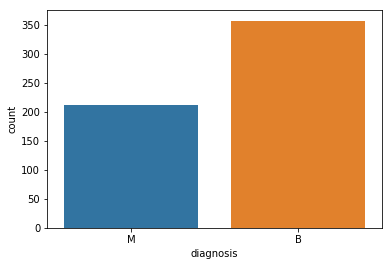

In [4]:
sn.countplot(df["diagnosis"],label='count')

In [5]:
# id 不用于classification，删去，diagnosis为分类标准
## feature的名字并不需要了解 because I believe machine learning is awesome :)

# df['diagnosis'] = pd.get_dummies(df['diagnosis'],drop_first=True)
dia = df['diagnosis']
df.drop('id', axis=1,inplace=True)
df.drop('diagnosis',axis=1,inplace=True)

In [6]:
data = df
data.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


# Data Visualization

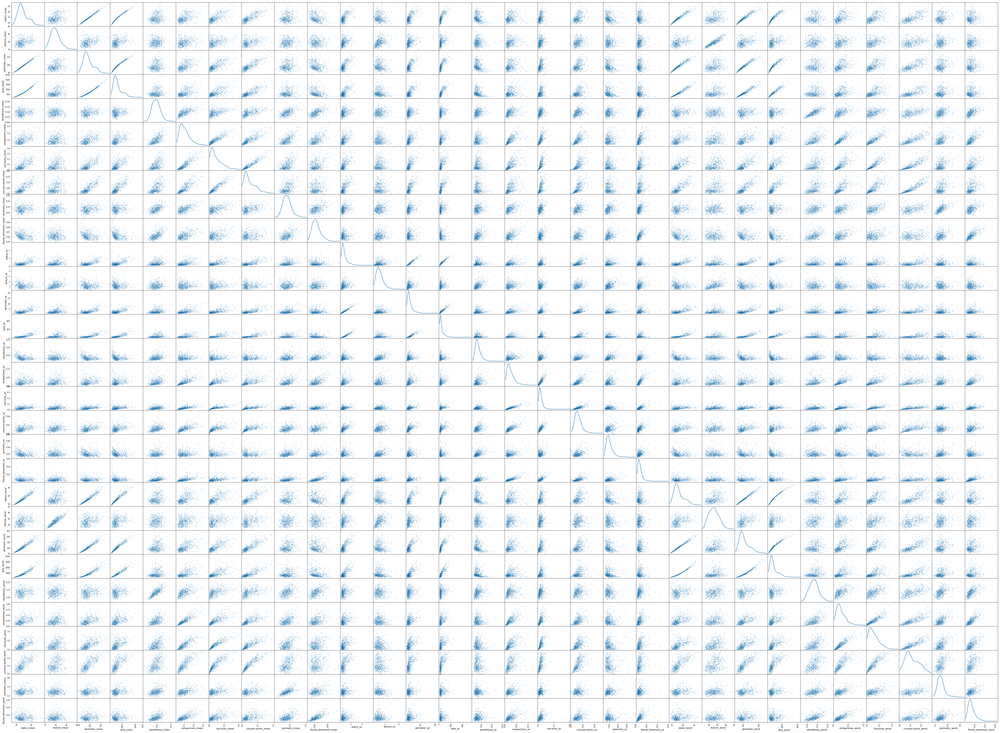

In [203]:
#构建散布矩阵（scatter matrix)
#通过散布矩阵可以看出在这个数据特征和其它特征中有关联性
pd.plotting.scatter_matrix(data, alpha = 0.3, figsize = (80,60), diagonal = 'kde');

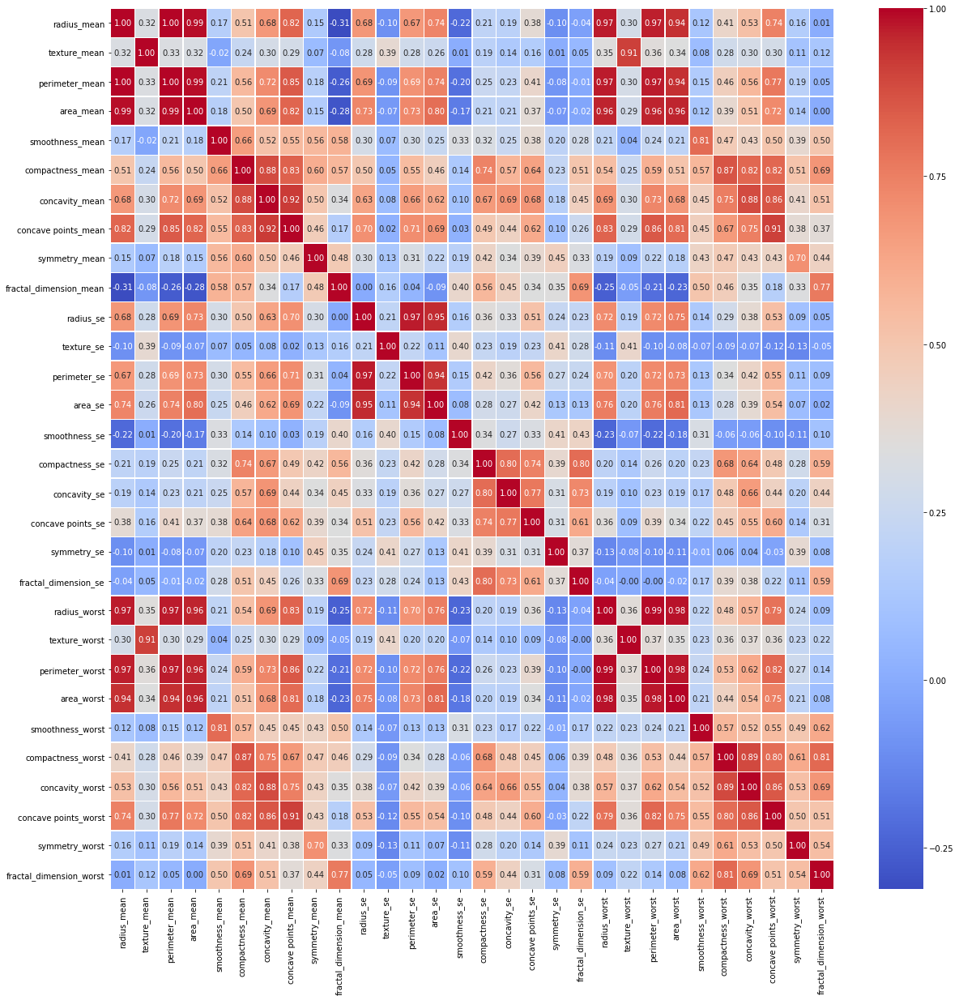

In [8]:
#相似相关性热力图
plt.subplots(figsize=(20, 20))
sn.heatmap(data.corr(), annot=True, linewidths=.5, fmt= '.2f', cmap='coolwarm')

### correlation features

- Compactness_mean, concavity_mean, concave points_mean
- radius_se, perimeter_se, area_se
- radius_worst, perimeter_worst, area_worst 
- Compactness_worst, concavity_worst, concave points_worst
- Compactness_se, concavity_se, concave points_se
- texture_mean, texture_worst
- area_worst, area_mean

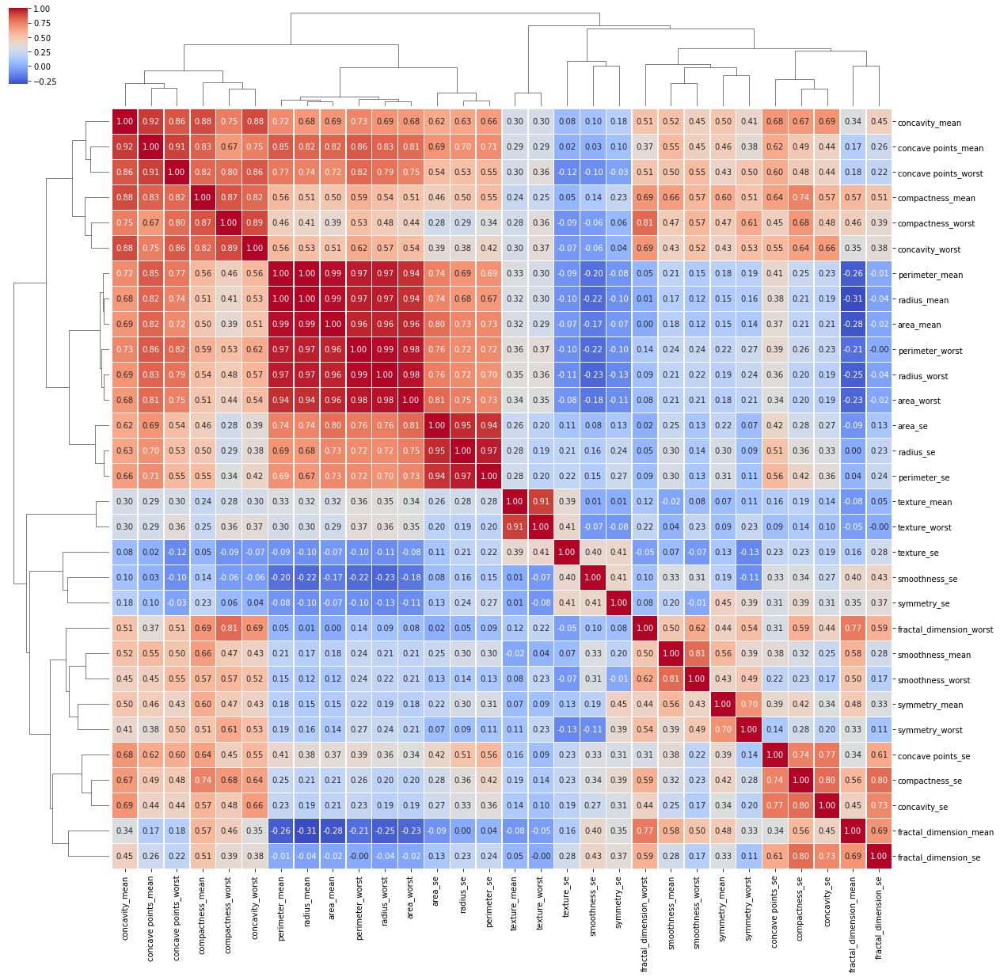

In [11]:
#加入分类的相关性热力图
sn.clustermap(data.corr(), annot=True, linewidths=.5, fmt= '.2f', cmap='coolwarm',figsize=(20,20))

## new correlation features
- 32 to 16 dimension
- concavity_mean, concave points_mean, concave points_worst
- compactness_mean, compactness_worst, concavity_worst
- perimeter_mean, radius_mean, area_mean, perimeter_worst, radius_worst, area_worst
- area_se, radius_se, perimeter_se
- texture_mean, texture_worst
- texture_se, smoothness_se, symmetry_se
- fractal_dimesion_worst
- smoothness_mean
- smoothness_worst
- symmetry_mean
- symmetry_worst
- concave points_se
- compactness_se
- concavity_se
- fractal_dimession_mean
- fractal_dimession_se

# Classification

## 1) in 32 features

In [7]:
#使用sklearn.cross_validation里的train_test_split模块分割数据集
from sklearn.cross_validation import train_test_split

#随机采样25%的数据用于测试，剩下的75%用于构建训练集
X_train,X_test,y_train,y_test = train_test_split(data,dia,test_size = 0.25,random_state = 33)

#查看训练样本的数量和类别分布
y_train.value_counts()

d:\program files\python36\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


B    268
M    158
Name: diagnosis, dtype: int64

In [8]:
X_train.shape

(426, 30)

In [9]:
y_train.shape

(426,)

### Logistic Regression

In [63]:
LR = LogisticRegression()
LR.fit(X_train, y_train)
LR_pred = LR.predict(X_test)
print(metrics.classification_report(y_test,LR_pred, digits = 5))
LR_cm=metrics.confusion_matrix(y_test,LR_pred)
#LR.score(X_test,y_test)

             precision    recall  f1-score   support

          B    0.94624   0.98876   0.96703        89
          M    0.98000   0.90741   0.94231        54

avg / total    0.95899   0.95804   0.95770       143



[[88  1]
 [ 5 49]]


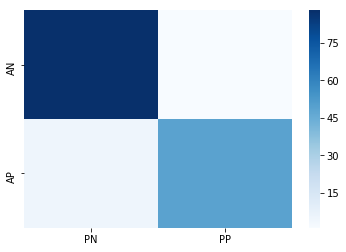

In [182]:
#计算混淆矩阵
print(LR_cm)
df_cm = pd.DataFrame(LR_cm,index = ['AN','AP'],columns=['PN','PP'])
sn.heatmap(df_cm,cbar = True,cmap = 'Blues')

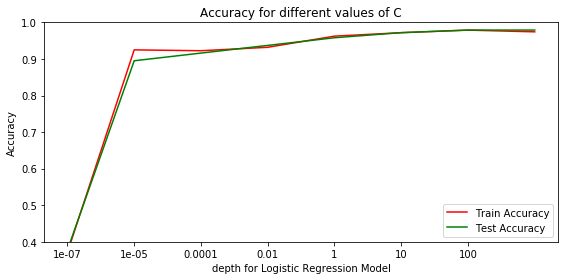

Accuracy is maximum at depth 100 and accuracy 0.979


In [187]:
# change depth
depth = [0.0000001,0.00001,0.0001,0.01, 1, 10, 100, 1000]
train_acc = []
test_acc = []

for i in depth:
    logit = LogisticRegression( C=i, class_weight='balanced')
    logit.fit(X_train, y_train)
    train_acc.append(logit.score(X_train, y_train))
    test_acc.append(logit.score(X_test, y_test))

#Visualize accuracy for different regularization parameters
plt.figure(figsize=(8,4))
plt.plot(train_acc, color='r', label='Train Accuracy')
plt.plot(test_acc, color='g', label='Test Accuracy')
plt.xticks(range(7), depth)
plt.xlabel('depth for Logistic Regression Model')
plt.ylabel('Accuracy')
plt.ylim(0.4,1)
plt.title('Accuracy for different values of C')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

print('Accuracy is maximum at depth', depth[np.argmax(test_acc)],'and accuracy', round(max(test_acc), 4))


In [65]:
LR_pro = LogisticRegression(C=100)
LR_pro.fit(X_train, y_train)
LR_pred_pro = LR_pro.predict(X_test)
print(metrics.classification_report(y_test,LR_pred_pro,digits = 5))
LR_cm_pro=metrics.confusion_matrix(y_test,LR_pred_pro)
#LR.score(X_test,y_test)

             precision    recall  f1-score   support

          B    0.96739   1.00000   0.98343        89
          M    1.00000   0.94444   0.97143        54

avg / total    0.97971   0.97902   0.97890       143



[[89  0]
 [ 3 51]]


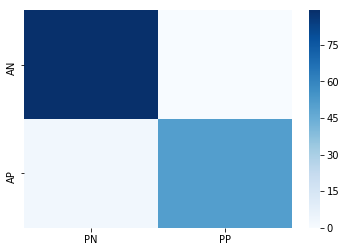

In [66]:
print(LR_cm_pro)
df_cm_pro = pd.DataFrame(LR_cm_pro,index = ['AN','AP'],columns=['PN','PP'])
sn.heatmap(df_cm_pro,cbar = True,cmap = 'Blues')

### KNN

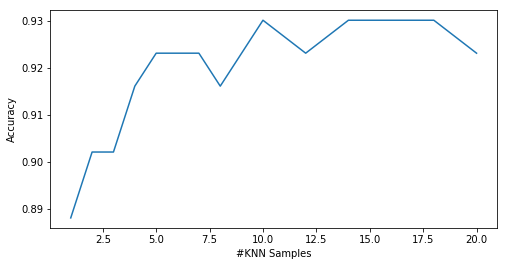

Accuracy is max in Sample 10 and accuracy 0.9301


In [195]:
#选取不同的近邻 N 来计算最合适的参数 K
scores = []
N = [1,2,3,4,5,6,7,8,10,12,14,16,18,20]
for k in N:
    KNN = KNeighborsClassifier(n_neighbors=k)
    KNN.fit(X_train,y_train)
    KNN_pred = KNN.predict(X_test)
    scores.append(metrics.accuracy_score(y_test,KNN_pred))
    #print(metrics.classification_report(y_test,LR_pred, digits = 5))
plt.figure(figsize=(8,4))
plt.plot(N, scores)
plt.xlabel("#KNN Samples")
plt.ylabel("Accuracy")
plt.show()
print("Accuracy is max in Sample",N[np.argmax(scores)],'and accuracy',round(max(scores),4))

In [43]:
KNN = KNeighborsClassifier(n_neighbors=10)
KNN.fit(X_train,y_train)
KNN_pred = KNN.predict(X_test)
#KNN.score(X_test,y_test)
scores.append(metrics.accuracy_score(y_test,KNN_pred))
print(metrics.classification_report(y_test,KNN_pred, digits = 5))

             precision    recall  f1-score   support

          B    0.92473   0.96629   0.94505        89
          M    0.94000   0.87037   0.90385        54

avg / total    0.93050   0.93007   0.92949       143



### Gaussian Naive Bayes

In [213]:
GNB = GaussianNB(priors=None)
GNB.fit(X_train,y_train)
GNB_pred = GNB.predict(X_test)
GNB_cm=metrics.confusion_matrix(y_test,GNB_pred)
print(metrics.classification_report(y_test,GNB_pred, digits = 5))
#GNB.score(X_test,y_test)

             precision    recall  f1-score   support

          B    0.92632   0.98876   0.95652        89
          M    0.97917   0.87037   0.92157        54

avg / total    0.94627   0.94406   0.94332       143



## 2) in 16 features

In [154]:
drop_list = ['concave points_mean', 'concave points_worst', 'compactness_worst', 'concavity_worst', 'radius_mean', 'area_mean', 'perimeter_worst', 'radius_worst', 'area_worst', 'radius_se', 'perimeter_se', 'texture_worst', 'smoothness_se', 'symmetry_se']
data_d = data.drop(drop_list,axis=1)
data_d.shape

(569, 16)

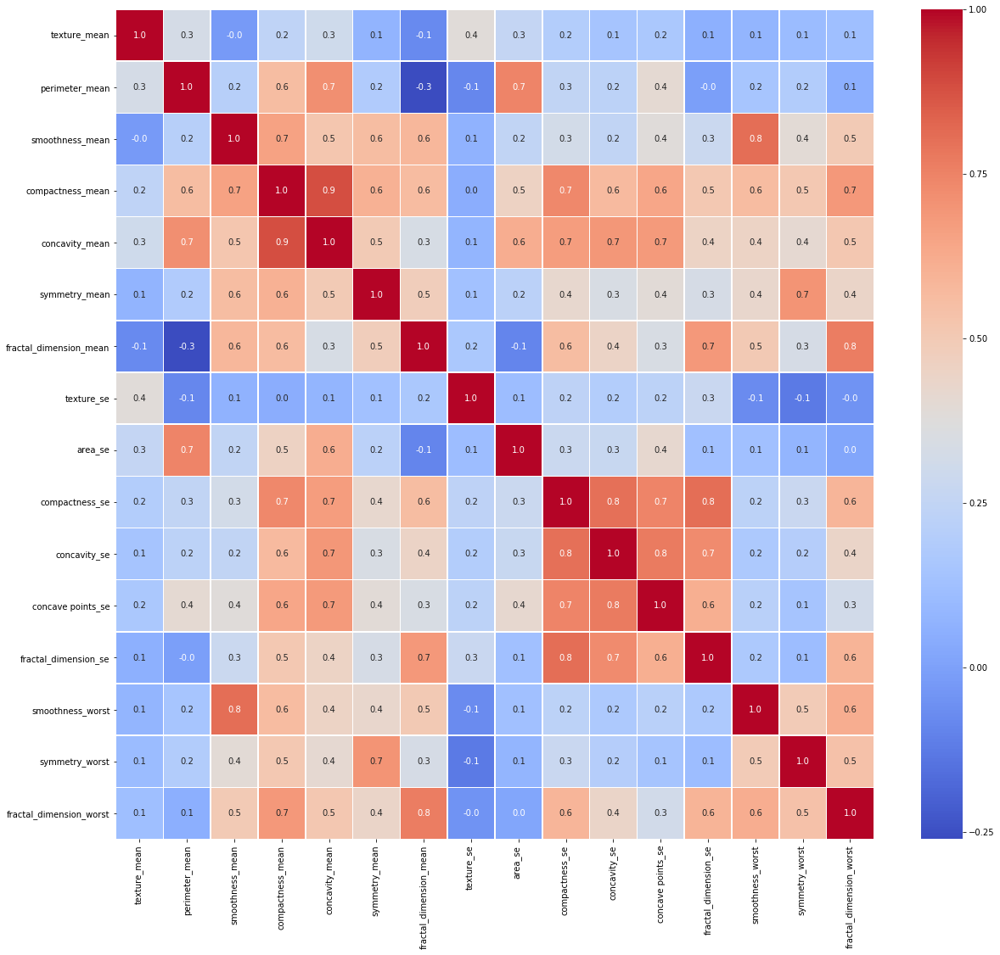

In [171]:
plt.subplots(figsize=(20, 18))
sn.heatmap(data_d.corr(), annot=True, linewidths=.5, fmt= '.1f', cmap='coolwarm')

In [172]:
X_train_d,X_test_d,y_train_d,y_test_d = train_test_split(data_d,dia,test_size = 0.25,random_state = 33)
y_train_d.value_counts()

B    268
M    158
Name: diagnosis, dtype: int64

### Logistic Regression

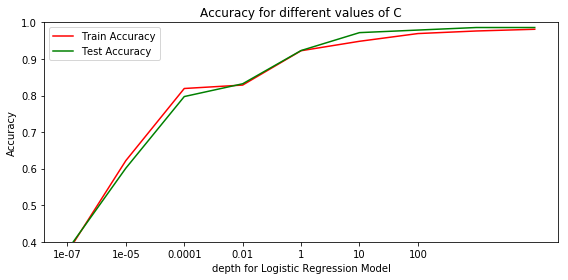

Accuracy is maximum at depth 1000 and accuracy 0.986


In [189]:
depth = [0.0000001,0.00001,0.0001,0.01, 1, 10, 100, 1000, 10000]
train_acc = []
test_acc = []

for i in depth:
    logit = LogisticRegression( C=i, class_weight='balanced')
    logit.fit(X_train_d, y_train_d)
    train_acc.append(logit.score(X_train_d, y_train_d))
    test_acc.append(logit.score(X_test_d, y_test_d))

#Visualize accuracy for different regularization parameters
plt.figure(figsize=(8,4))
plt.plot(train_acc, color='r', label='Train Accuracy')
plt.plot(test_acc, color='g', label='Test Accuracy')
plt.xticks(range(7), depth)
plt.xlabel('depth for Logistic Regression Model')
plt.ylabel('Accuracy')
plt.ylim(0.4,1)
plt.title('Accuracy for different values of C')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

print('Accuracy is maximum at depth', depth[np.argmax(test_acc)],'and accuracy', round(max(test_acc), 4))


In [190]:
LR_pro_d = LogisticRegression(C=1000)
LR_pro_d.fit(X_train_d, y_train_d)
LR_pred_pro_d = LR_pro_d.predict(X_test_d)
print(metrics.classification_report(y_test_d,LR_pred_pro_d,digits = 5))
LR_cm_pro_d=metrics.confusion_matrix(y_test_d,LR_pred_pro_d)
#LR.score(X_test,y_test)

             precision    recall  f1-score   support

          B    0.97802   1.00000   0.98889        89
          M    1.00000   0.96296   0.98113        54

avg / total    0.98632   0.98601   0.98596       143



[[89  0]
 [ 2 52]]


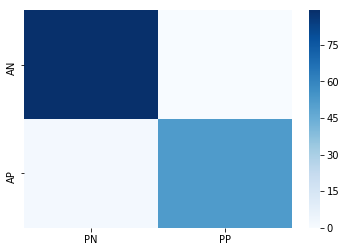

In [191]:
print(LR_cm_pro_d)
df_cm_pro_d = pd.DataFrame(LR_cm_pro_d,index = ['AN','AP'],columns=['PN','PP'])
sn.heatmap(df_cm_pro_d,cbar = True,cmap = 'Blues')

### KNN

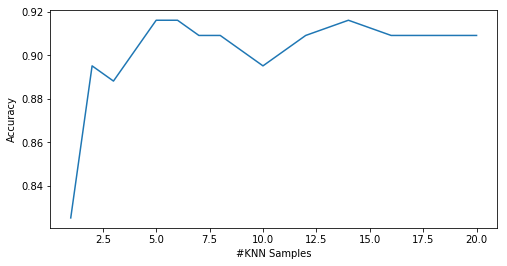

Accuracy is max in Sample 5 and accuracy 0.9161


In [194]:
#选取不同的近邻 N 来计算最合适的参数 K
scores_d = []
N = [1,2,3,4,5,6,7,8,10,12,14,16,18,20]
for k in N:
    KNN_d = KNeighborsClassifier(n_neighbors=k)
    KNN_d.fit(X_train_d,y_train_d)
    KNN_pred_d = KNN_d.predict(X_test_d)
    scores_d.append(metrics.accuracy_score(y_test_d,KNN_pred_d))
    #print(metrics.classification_report(y_test,LR_pred, digits = 5))
plt.figure(figsize=(8,4))
plt.plot(N, scores_d)
plt.xlabel("#KNN Samples")
plt.ylabel("Accuracy")
plt.show()
print("Accuracy is max in Sample",N[np.argmax(scores_d)],'and accuracy',round(max(scores_d),4))

In [200]:
KNN_pro_d = KNeighborsClassifier(n_neighbors=5)
KNN_pro_d.fit(X_train_d,y_train_d)
KNN_pred_pro_d = KNN_pro_d.predict(X_test_d)
#KNN.score(X_test,y_test)
scores.append(metrics.accuracy_score(y_test_d,KNN_pred_pro_d))
print(metrics.classification_report(y_test_d,KNN_pred_pro_d, digits = 5))

             precision    recall  f1-score   support

          B    0.91398   0.95506   0.93407        89
          M    0.92000   0.85185   0.88462        54

avg / total    0.91625   0.91608   0.91539       143



### Random Forest

In [211]:
RF = RandomForestClassifier()
RF.fit(X_train,y_train)
RF_prod = RF.predict(X_test)
print(metrics.classification_report(y_test,RF_prod,digits = 5))

             precision    recall  f1-score   support

          B    0.92473   0.96629   0.94505        89
          M    0.94000   0.87037   0.90385        54

avg / total    0.93050   0.93007   0.92949       143



In [212]:
RF_d = RandomForestClassifier()
RF_d.fit(X_train_d,y_train_d)
RF_prod_d = RF_d.predict(X_test_d)
print(metrics.classification_report(y_test_d,RF_prod_d,digits = 5))

             precision    recall  f1-score   support

          B    0.94624   0.98876   0.96703        89
          M    0.98000   0.90741   0.94231        54

avg / total    0.95899   0.95804   0.95770       143



## Dimension Reduction

### PCA

Text(0,0.5,'explained_variance_ratio_')

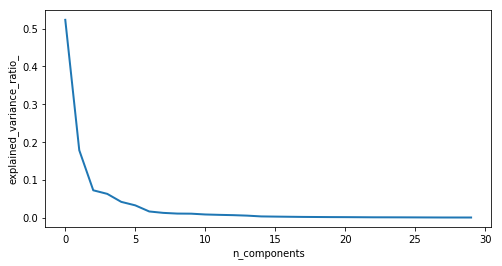

In [112]:
## normalization
X_train_N = (X_train-X_train.mean())/(X_train.max()-X_train.min())
X_test_N = (X_test-X_test.mean())/(X_test.max()-X_test.min())
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(X_train_N)
plt.figure(figsize=(8,4))
plt.plot(pca.explained_variance_ratio_, linewidth=2)
plt.axis('tight')
plt.xlabel('n_components')
plt.ylabel('explained_variance_ratio_')

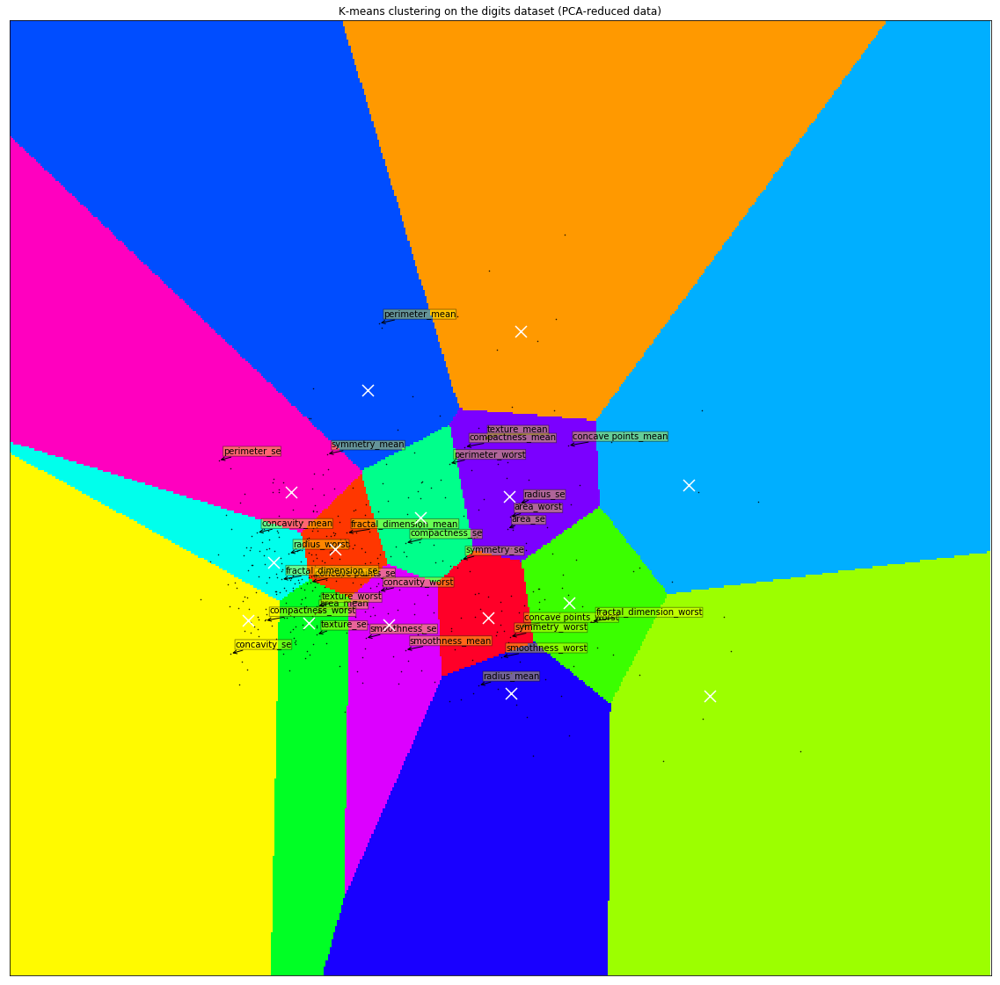

In [148]:
pca_pro = PCA(n_components=2,svd_solver='full').fit_transform(X_train_N)
kmeans = KMeans(init='k-means++', n_clusters=15, n_init=10)
kmeans.fit(pca_pro)
`
# Step size of the mesh. Decrease to increase the quality of the VQ.
h = .01     # point in the mesh [x_min, x_max]x[y_min, y_max].

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = pca_pro[:, 0].min() - 1, pca_pro[:, 0].max() + 1
y_min, y_max = pca_pro[:, 1].min() - 1, pca_pro[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(figsize=(20,20))
plt.clf()
plt.imshow(Z, cmap='gist_rainbow', interpolation='nearest',
           extent=( xx.min(), xx.max(), yy.min(), yy.max()),
           aspect='auto', origin='lower')

words = X_train.columns
plt.plot(pca_pro[:, 0], pca_pro[:, 1], 'k.', markersize=1)
for label, x, y in zip(words, pca_pro[:, 0], pca_pro[:, 1]):
    plt.annotate(
        label,
        xy=(x, y), xytext=(5,5),
        textcoords='offset points', ha='left', va='bottom',
        bbox=dict(boxstyle='round,pad=0.01', fc='yellow', alpha=0.4),
        arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))
    
# Plot the centroids as a white X
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='w', zorder=10)
plt.title('K-means clustering on the digits dataset (PCA-reduced data)')
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()

# Other

In [180]:
#标准化操作，分离均值，标准差，极值
#data_std = (data - data.mean()) / (data.std())
data_mean = data_std.iloc[:,0:10]
data_se = data_std.iloc[:,10:20]
data_worst = data_std.iloc[:,20:30]

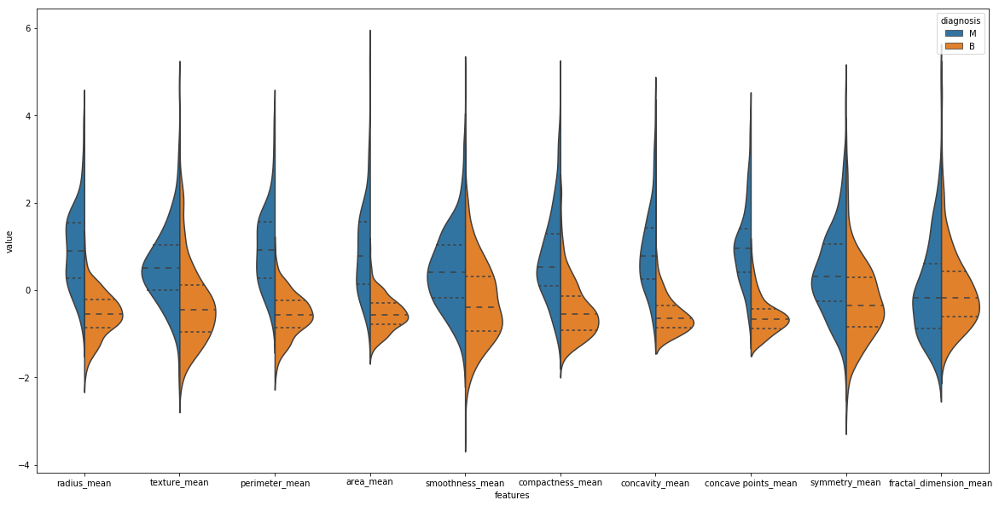

In [182]:
# 均值的标准化分布
data_mean_1 = pd.concat([data_mean,dia],axis=1)
data_mean_2 = pd.melt(data_mean_1,id_vars='diagnosis',var_name='features',value_name='value')
plt.figure(figsize=(20,10))
sn.violinplot(x='features', y='value', hue='diagnosis', data=data_mean_2,split=True,inner='quart')

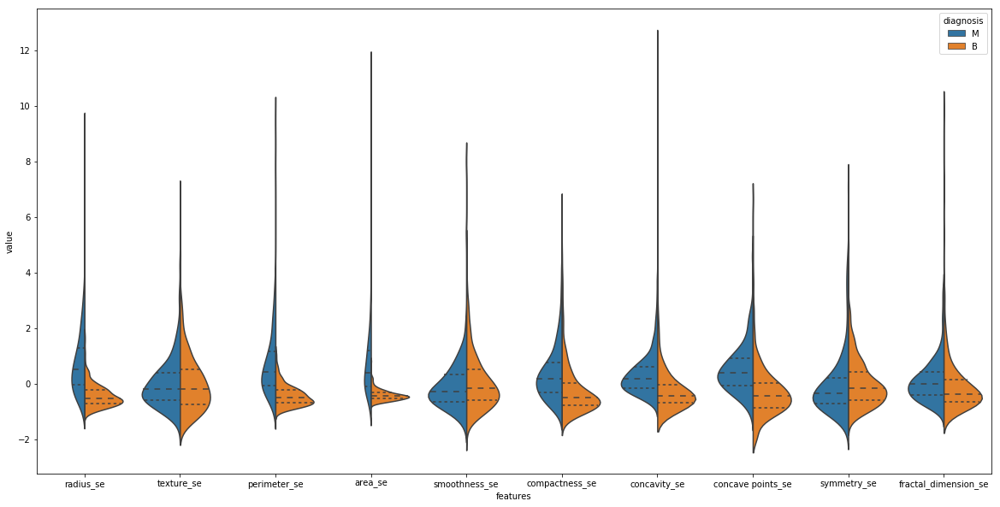

In [183]:
# 标准差的分布
data_se_1 = pd.concat([data_se,dia],axis=1)
data_se_2 = pd.melt(data_se_1,id_vars='diagnosis',var_name='features',value_name='value')
plt.figure(figsize=(20,10))
sn.violinplot(x='features', y='value', hue='diagnosis', data=data_se_2,split=True,inner='quart')

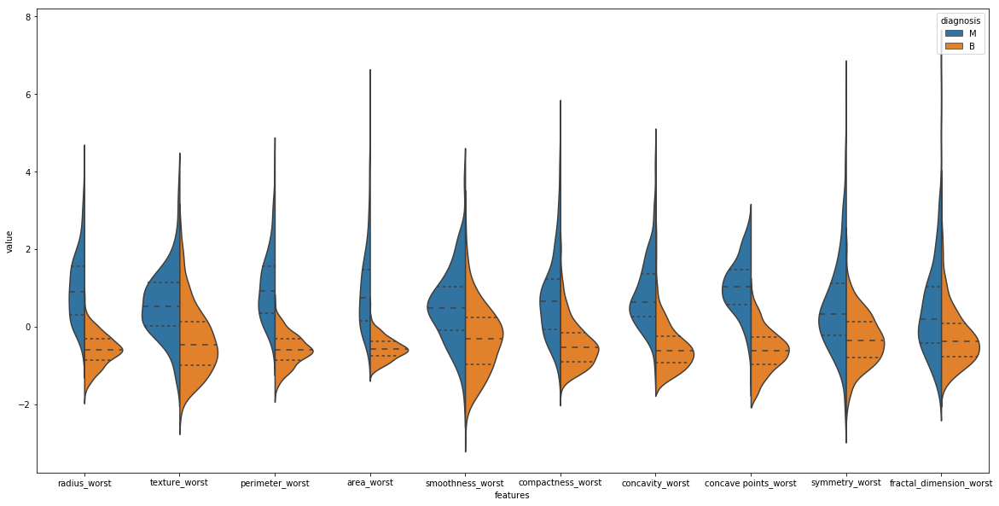

In [184]:
# 极值分布
data_worst_1 = pd.concat([data_worst,dia],axis=1)
data_worst_2 = pd.melt(data_worst_1,id_vars='diagnosis',var_name='features',value_name='value')
plt.figure(figsize=(20,10))
sn.violinplot(x='features', y='value', hue='diagnosis', data=data_worst_2,split=True,inner='quart')